# BERTopic

In [1]:
import torch
import time
import pandas as pd
from bertopic import BERTopic
import os
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel

print(torch.cuda.is_available())
print(torch.__version__)
print(torch.version.cuda)

os.environ["TOKENIZERS_PARALLELISM"] = "false"

2022-11-28 16:25:25.054435: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


True
1.13.0+cu117
11.7


In [16]:
# Set fresh = True if you want to train from scratch
def train_and_save(topic_model, docs):
    print(f"Training model with {len(docs)} docs")
    st = time.process_time()
    topics, probs = topic_model.fit_transform(docs)
    et = time.process_time()
    print(f"CPU Execution time: {et-st} seconds")
    topic_model.save("topic_models/{}_model".format(int(len(docs))))
    return topic_model, topics, probs

In [3]:
def load_model(path):
    return BERTopic.load(path)

In [ ]:
def get_coherence(topic_model, topic_words, tokens, corpus, dictionary, coherence):
    print(f"Getting {coherence} Coherence")
    max_topics = len(topic_words)
    for i in range(10, max_topics, 10):
        st = time.process_time()
        coherence_model = CoherenceModel(topics=topic_words[:i], 
                                     texts=tokens, 
                                     corpus=corpus,
                                     dictionary=dictionary, 
                                     coherence=coherence)
        coherence_score = coherence_model.get_coherence()
        et = time.process_time()
        print(f"{i} topics in {et-st:.2f} seconds: {coherence_score}")

In [8]:
df = pd.read_csv("cyberbullying_tweets_cleaned.csv")

In [9]:
df

,tweet_text,cyberbullying_type,label,cleaned_text
0,"In other words #katandandre, your food was cra...",not_cyberbullying,0,"['in', 'other', 'words', 'katandandre', 'your'..."
1,Why is #aussietv so white? #MKR #theblock #ImA...,not_cyberbullying,0,"['why', 'is', 'aussietv', 'so', 'white', 'mkr'..."
2,@XochitlSuckkks a classy whore? Or more red ve...,not_cyberbullying,0,"['a', 'classy', 'whore', 'or', 'more', 'red', ..."
3,"@Jason_Gio meh. :P thanks for the heads up, b...",not_cyberbullying,0,"['meh', 'p', 'thanks', 'for', 'the', 'heads', ..."
4,@RudhoeEnglish This is an ISIS account pretend...,not_cyberbullying,0,"['this', 'is', 'an', 'isis', 'account', 'prete..."
...,...,...,...,...
47687,"Black ppl aren't expected to do anything, depe...",ethnicity,5,"['black', 'ppl', 'are', 'not', 'expected', 'to..."
47688,Turner did not withhold his disappointment. Tu...,ethnicity,5,"['turner', 'did', 'not', 'withhold', 'his', 'd..."
47689,I swear to God. This dumb nigger bitch. I have...,ethnicity,5,"['i', 'swear', 'to', 'god', 'this', 'dumb', 'n..."
47690,Yea fuck you RT @therealexel: IF YOURE A NIGGE...,ethnicity,5,"['yea', 'fuck', 'you', 'rt', 'if', 'youre', 'a..."


In [10]:
# setup for training
docs_all = df['tweet_text'].tolist() # using only body of post
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)

In [36]:
topic_model, topics, probs = train_and_save(topic_model, docs_all)

Training model with 47692 docs


Batches:   0%|          | 0/1491 [00:00<?, ?it/s]

2022-11-28 16:40:01,207 - BERTopic - Transformed documents to Embeddings
2022-11-28 16:40:41,210 - BERTopic - Reduced dimensionality
2022-11-28 16:47:30,382 - BERTopic - Clustered reduced embeddings


CPU Execution time: 770.65332563 seconds


In [37]:
freq = topic_model.get_topic_info(); freq.head(5)

,Topic,Count,Name
0,-1,21975,-1_the_and_school_to
1,0,889,0_yup_thanks_yes_jaredchase
2,1,840,1_dumb_nigger_fuck_shut
3,2,820,2_india_hindus_hindu_terrorism
4,3,672,3_bully_bullying_cyber_lol


In [38]:
topic_model.get_topic(0)  # Select the most frequent topic

[('yup', 0.02155937017515197),
 ('thanks', 0.018846719172464714),
 ('yes', 0.015625118384885034),
 ('jaredchase', 0.010722477912487326),
 ('lt3', 0.010431600628818488),
 ('thank', 0.010132529341466903),
 ('jillwetzler', 0.009940997980339162),
 ('awesome', 0.009094076657530755),
 ('haha', 0.008857335080225272),
 ('sure', 0.007062050634099597)]

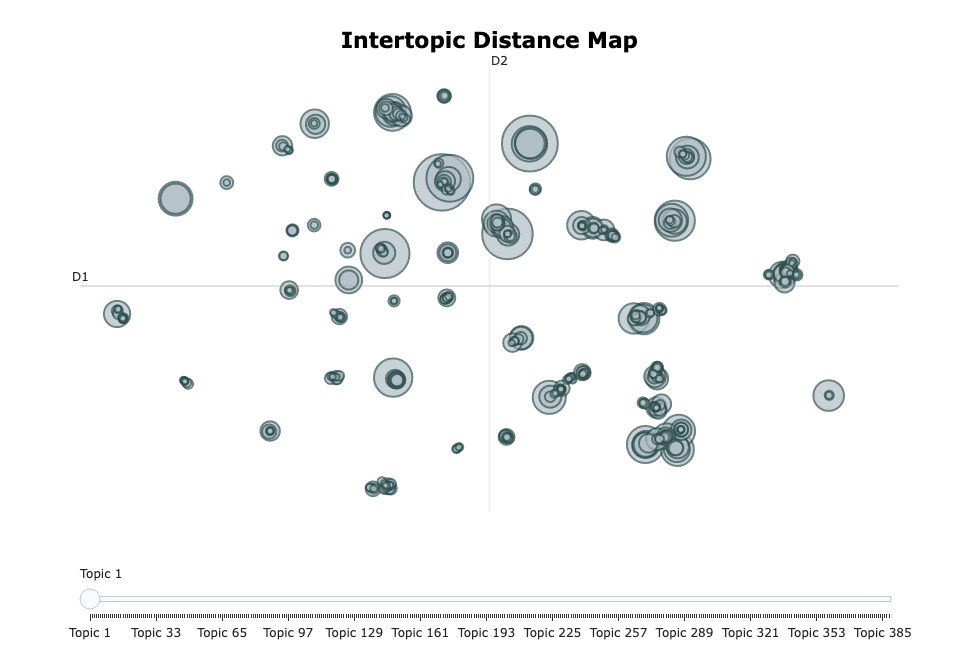

In [39]:
topic_model.visualize_topics()

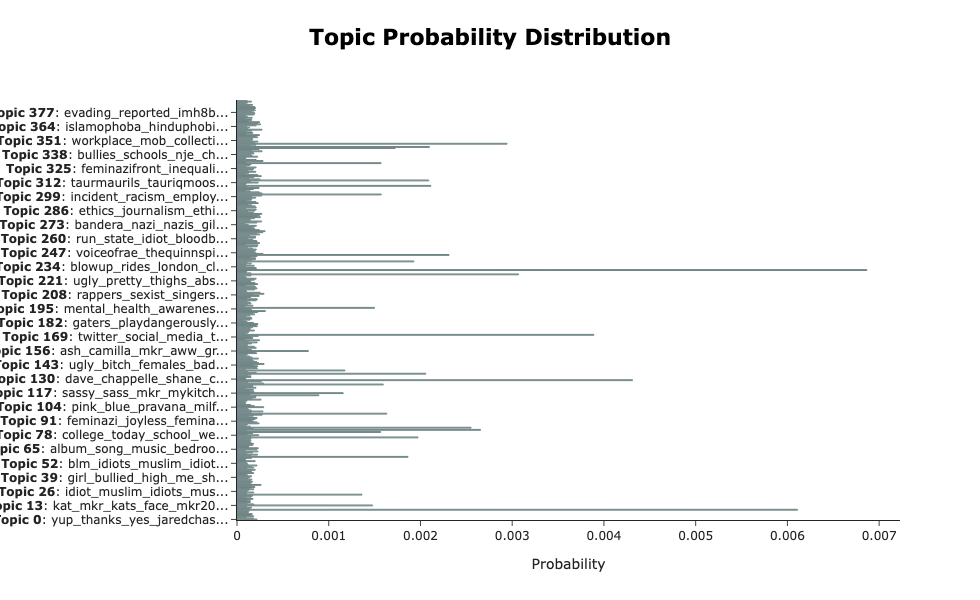

In [48]:
topic_model.visualize_distribution(probs[1], min_probability=0.)

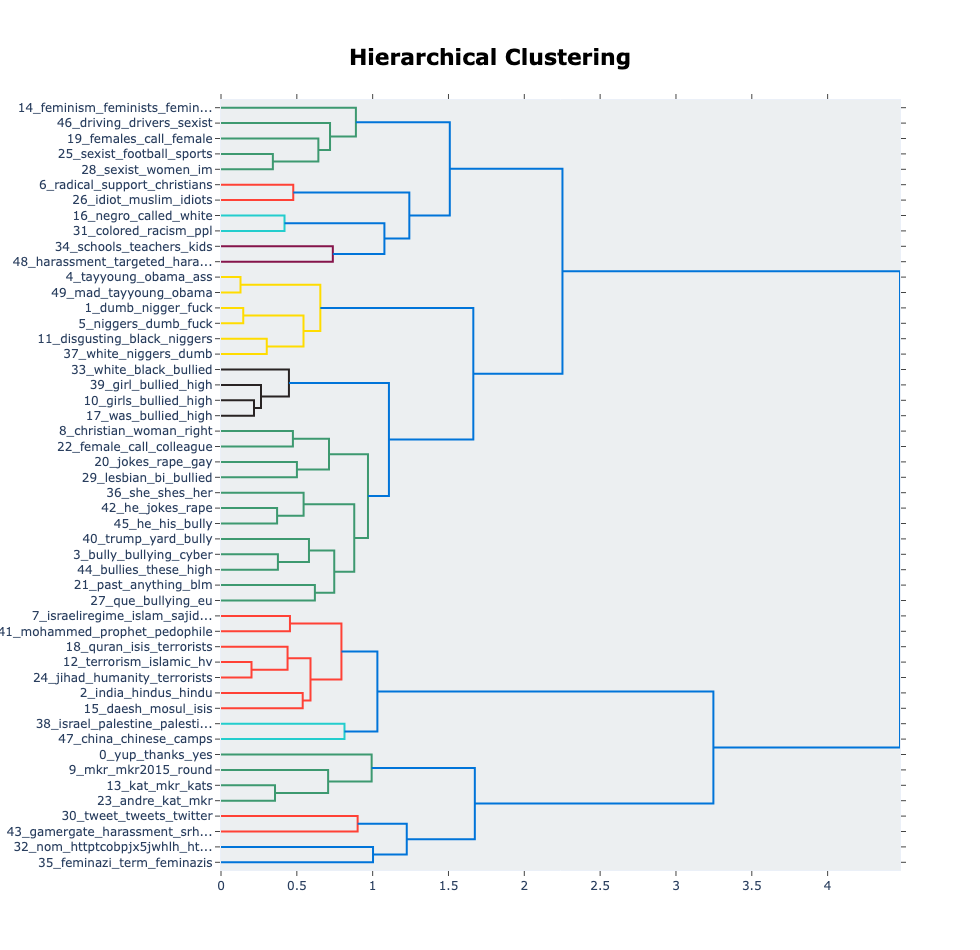

In [49]:
topic_model.visualize_hierarchy(top_n_topics=50)

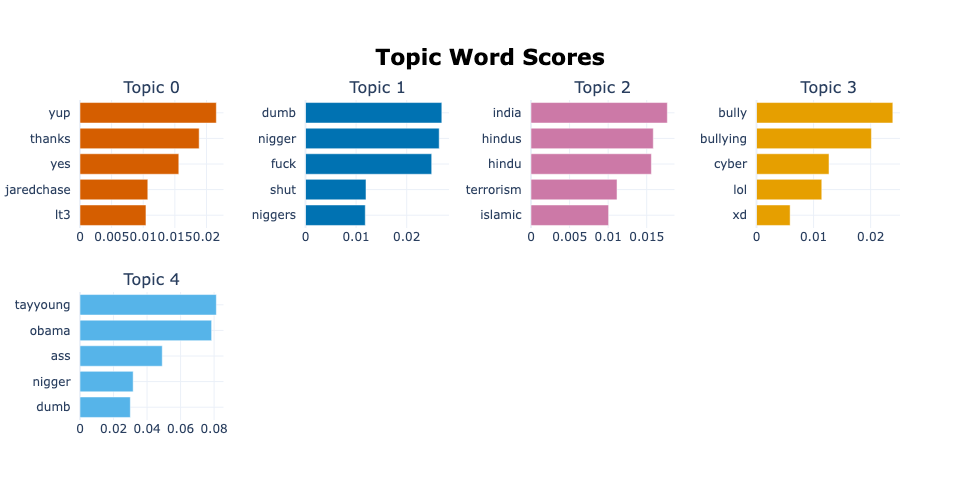

In [50]:
topic_model.visualize_barchart(top_n_topics=5)

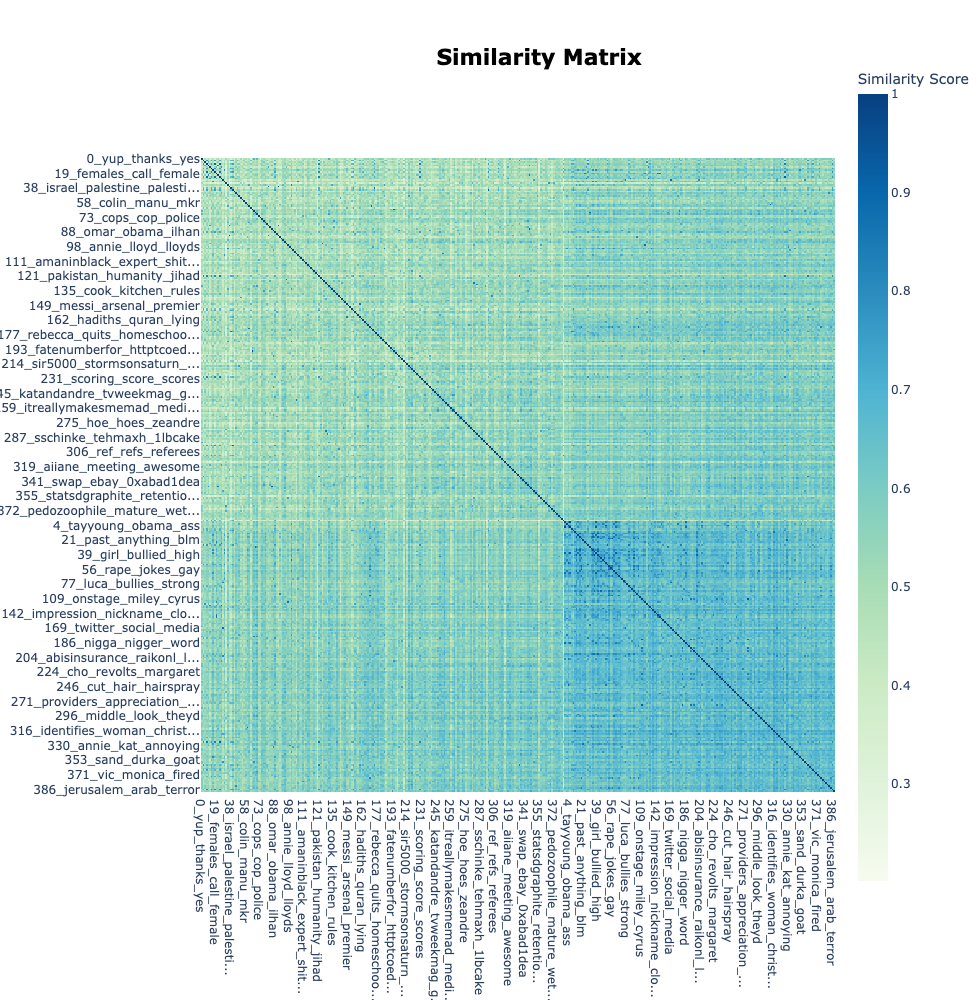

In [51]:
topic_model.visualize_heatmap(n_clusters=2, width=1000, height=1000)

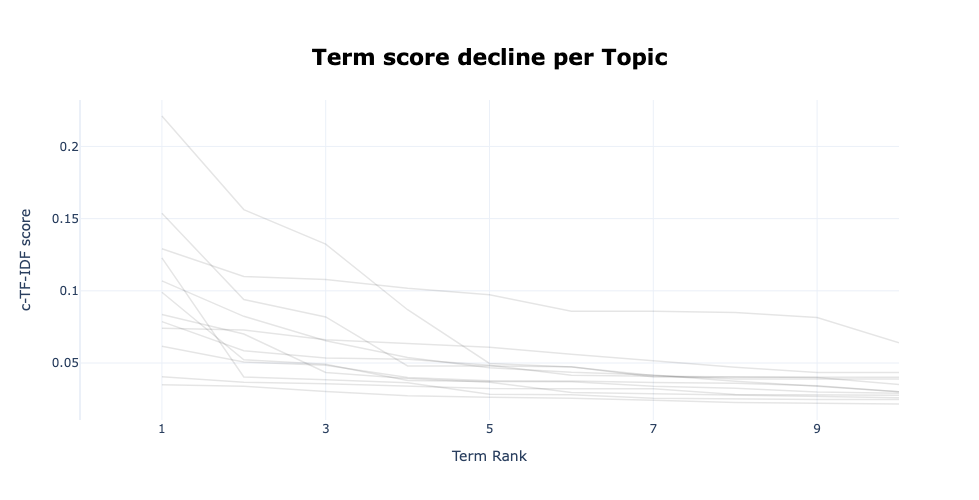

In [35]:
topic_model.visualize_term_rank()

In [ ]:
saved_models = [
    '47692_model'
]

prefix = 'topic_models/'

for saved_model in saved_models:
    print(f"Evaluating saved model: {saved_model}")
    doc_length, _ = saved_model.split('_')
    doc_length = int(doc_length)
    docs = docs_all

    topic_model = load_model(prefix + saved_model)

    # get topics and other stuff from model
    vectorizer = topic_model.vectorizer_model
    tokenizer = vectorizer.build_tokenizer()
    words = vectorizer.get_feature_names()
    tokens = [tokenizer(doc) for doc in docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]
    topics = topic_model.get_topics()
    topic_words = [[words for words, _ in topic_model.get_topic(topic)] 
                   for topic in range(len(set(topics))-1)]


    get_coherence(topic_model, topic_words, tokens, corpus, dictionary, 'u_mass')
    get_coherence(topic_model, topic_words, tokens, corpus, dictionary, 'c_v')
    